In [36]:
import cv2

In [37]:
print(cv2.__version__)

4.4.0


In [4]:
# 이미지 증식을 하는 경우?
# 이미지 종류의 밸런스가 잘 안맞을때, 

In [5]:
from keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator

In [7]:
import matplotlib.pyplot as plt

In [9]:
img = load_img('mybts.jpg')

In [18]:
# 이미지 -> array
data = img_to_array(img)
data.shape

(1333, 2000, 3)

In [19]:
# 첫번째 차원을 추가하여 확장
from numpy import expand_dims
import numpy as np

In [20]:
samples = expand_dims(data, 0) # axis = 0

In [22]:
samples.shape # 4차원으로 이미지를 만든 후 이미지 증식

(1, 1333, 2000, 3)

In [23]:
datagen = ImageDataGenerator(width_shift_range=[-200,200]) # 범위 지정

In [25]:
it = datagen.flow(samples, batch_size=1)
it

In [27]:
fig = plt.figure(figsize=(30,30))

<Figure size 2160x2160 with 0 Axes>

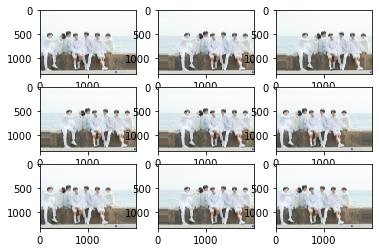

In [29]:
for i in range(9):
    plt.subplot(3,3,i+1) # 3줄 3칸의 맨 왼쪽이 3,31이니까 저렇게 해.
    batch = it.next()
    image = batch[0].astype('uint8') # 4차원 -> 3차원 // float -> unsigned int8 (양수만 있는 8bit: 0~255)
    plt.imshow(image)

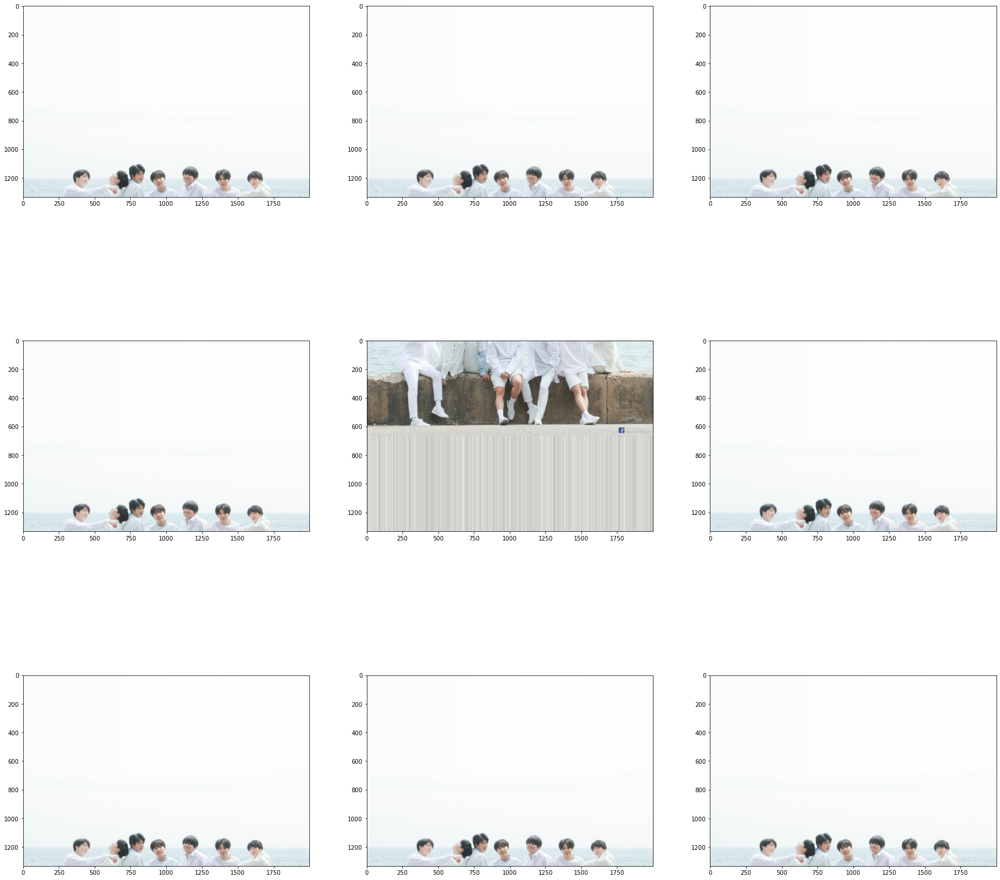

In [30]:
datagen = ImageDataGenerator(height_shift_range=[0.5])  # 높이는 비율로 준다.
it = datagen.flow(samples, batch_size=1)
fig = plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3,3,i+1) 
    batch = it.next()
    image = batch[0].astype('uint8') # 4차원 -> 3차원 // float -> unsigned int8 (양수만 있는 8bit: 0~255)
    plt.imshow(image)

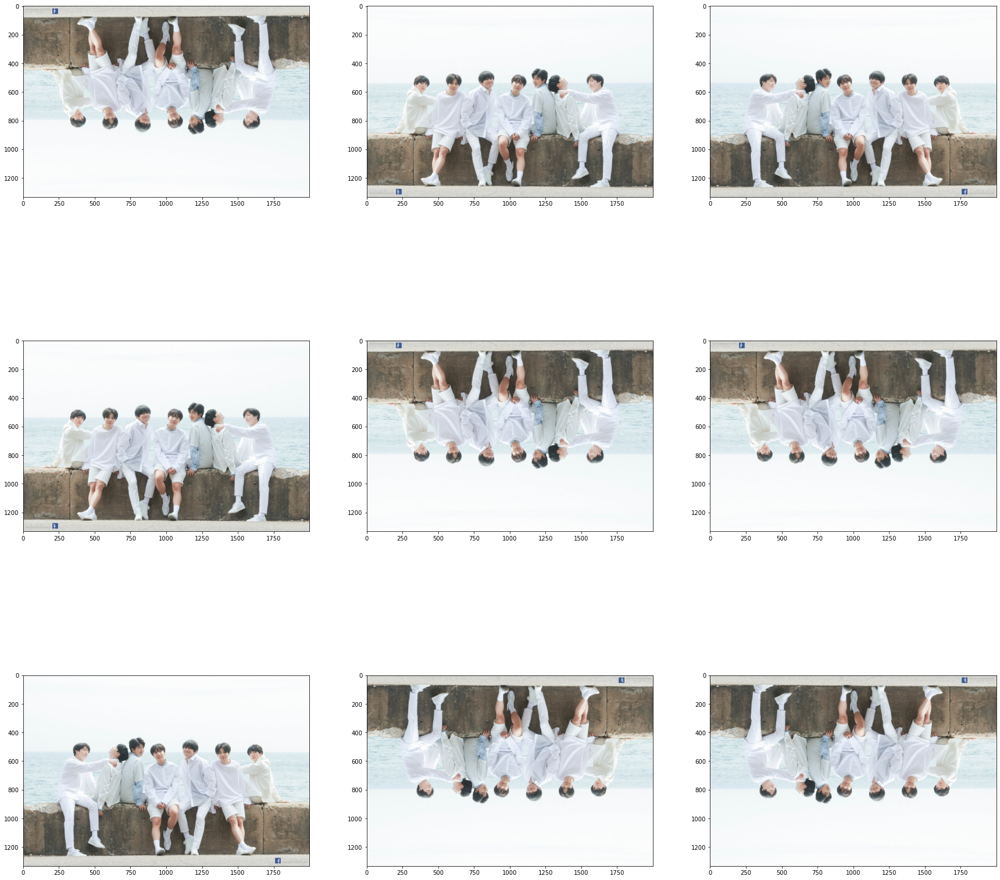

In [31]:
datagen = ImageDataGenerator(horizontal_flip=True,
                            vertical_flip=True)  # 상하좌우 뒤집기
it = datagen.flow(samples, batch_size=1)
fig = plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3,3,i+1) 
    batch = it.next()
    image = batch[0].astype('uint8') # 4차원 -> 3차원 // float -> unsigned int8 (양수만 있는 8bit: 0~255)
    plt.imshow(image)

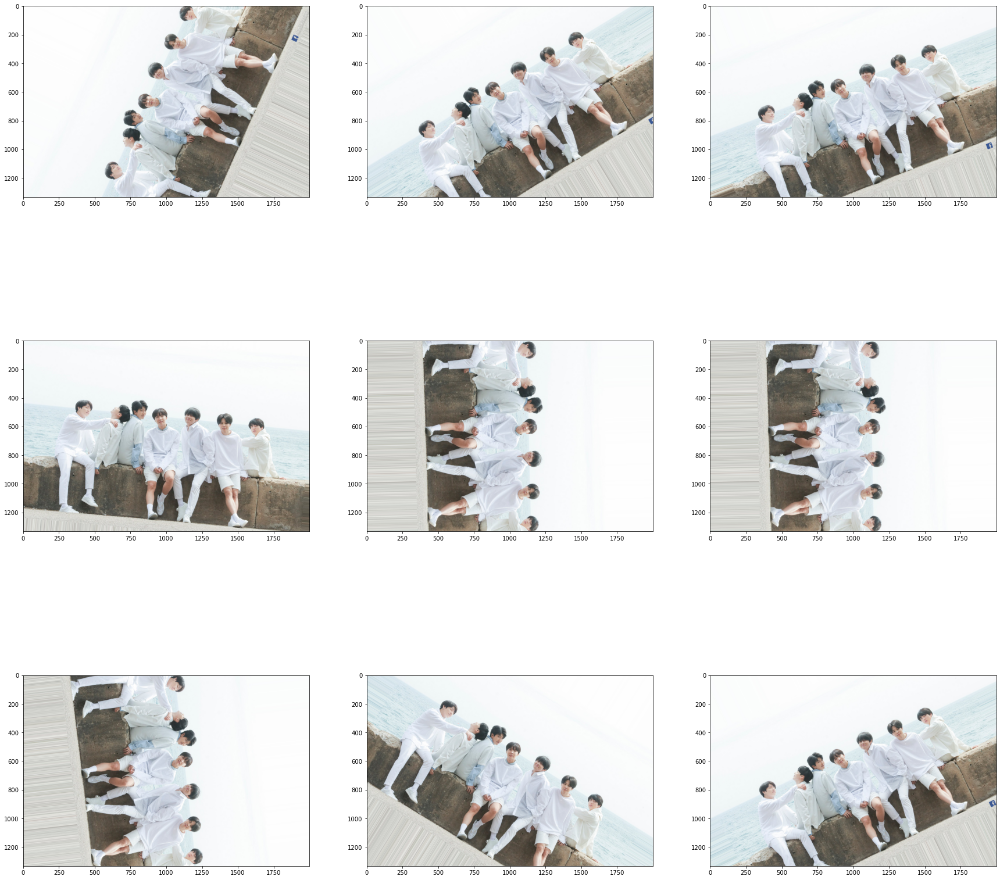

In [32]:
datagen = ImageDataGenerator(rotation_range=90)  # 이미지 랜덤하게 회전
it = datagen.flow(samples, batch_size=1)
fig = plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3,3,i+1) 
    batch = it.next()
    image = batch[0].astype('uint8') # 4차원 -> 3차원 // float -> unsigned int8 (양수만 있는 8bit: 0~255)
    plt.imshow(image)

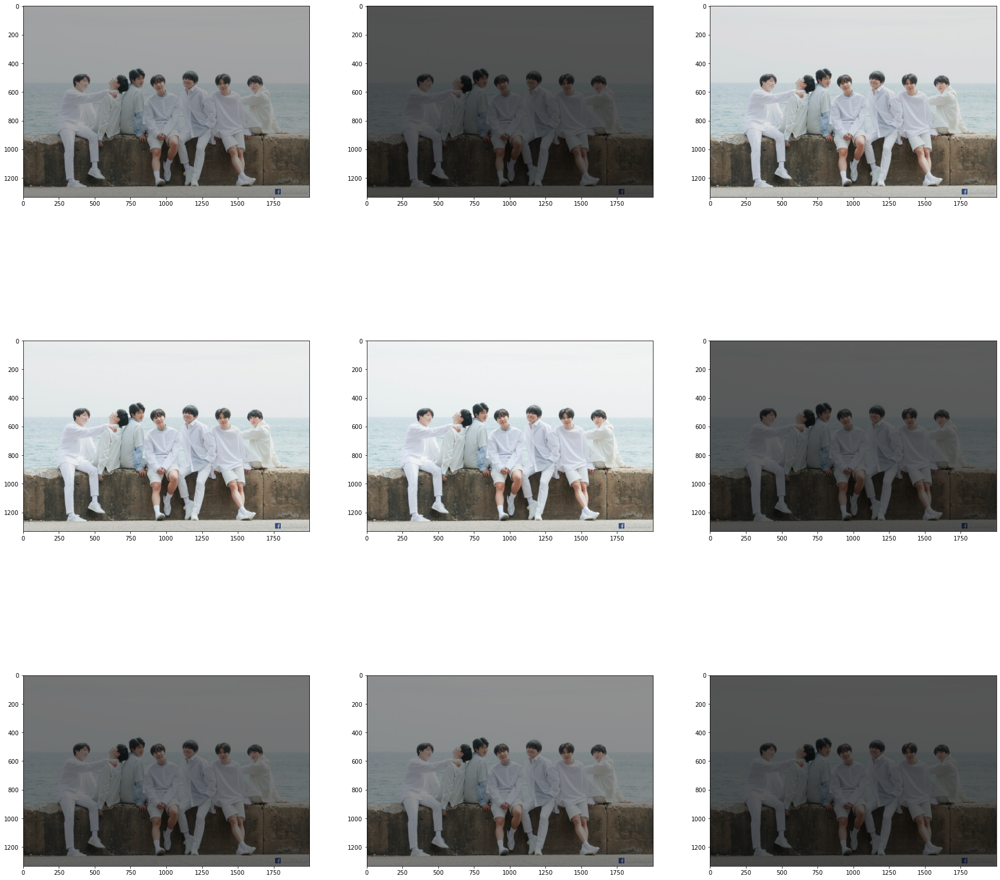

In [33]:
datagen = ImageDataGenerator(brightness_range=[0.2,1])  # 이미지 밝기 조정(0(어둠)~1(밝음))
it = datagen.flow(samples, batch_size=1)
fig = plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3,3,i+1) 
    batch = it.next()
    image = batch[0].astype('uint8') # 4차원 -> 3차원 // float -> unsigned int8 (양수만 있는 8bit: 0~255)
    plt.imshow(image)

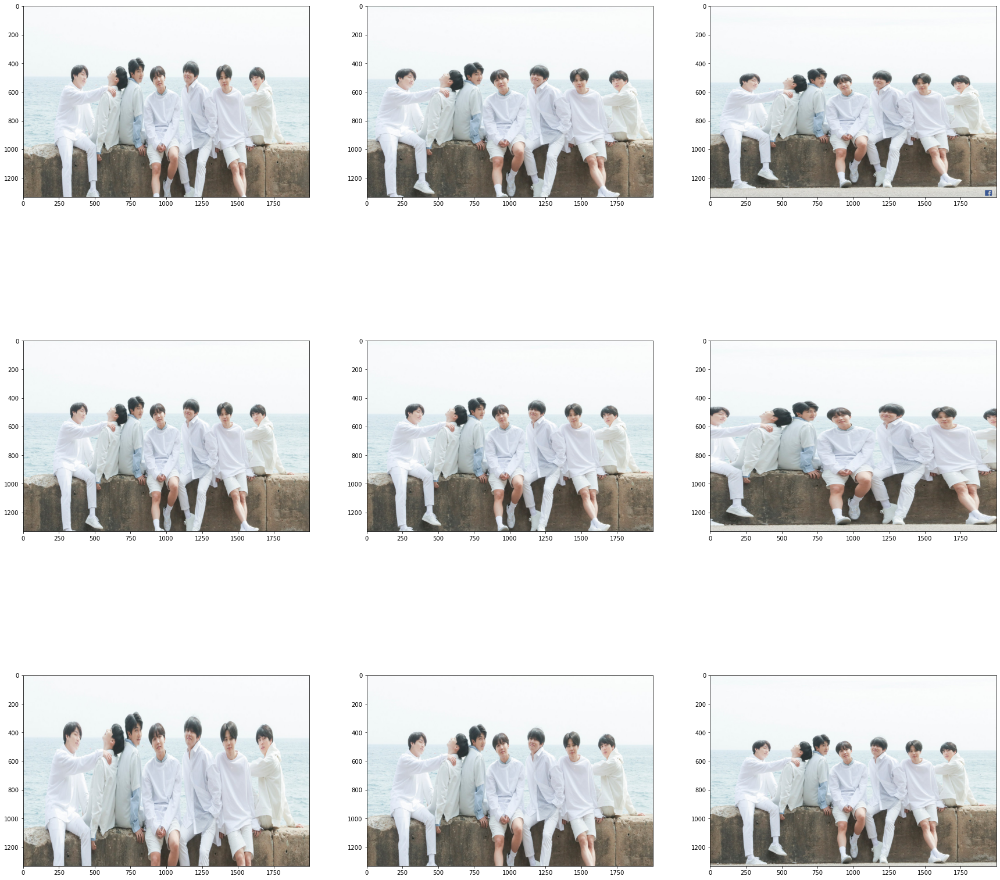

In [35]:
datagen = ImageDataGenerator(zoom_range=[0.5,1])  # zoom
it = datagen.flow(samples, batch_size=1)
fig = plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3,3,i+1) 
    batch = it.next()
    image = batch[0].astype('uint8') # 4차원 -> 3차원 // float -> unsigned int8 (양수만 있는 8bit: 0~255)
    plt.imshow(image)

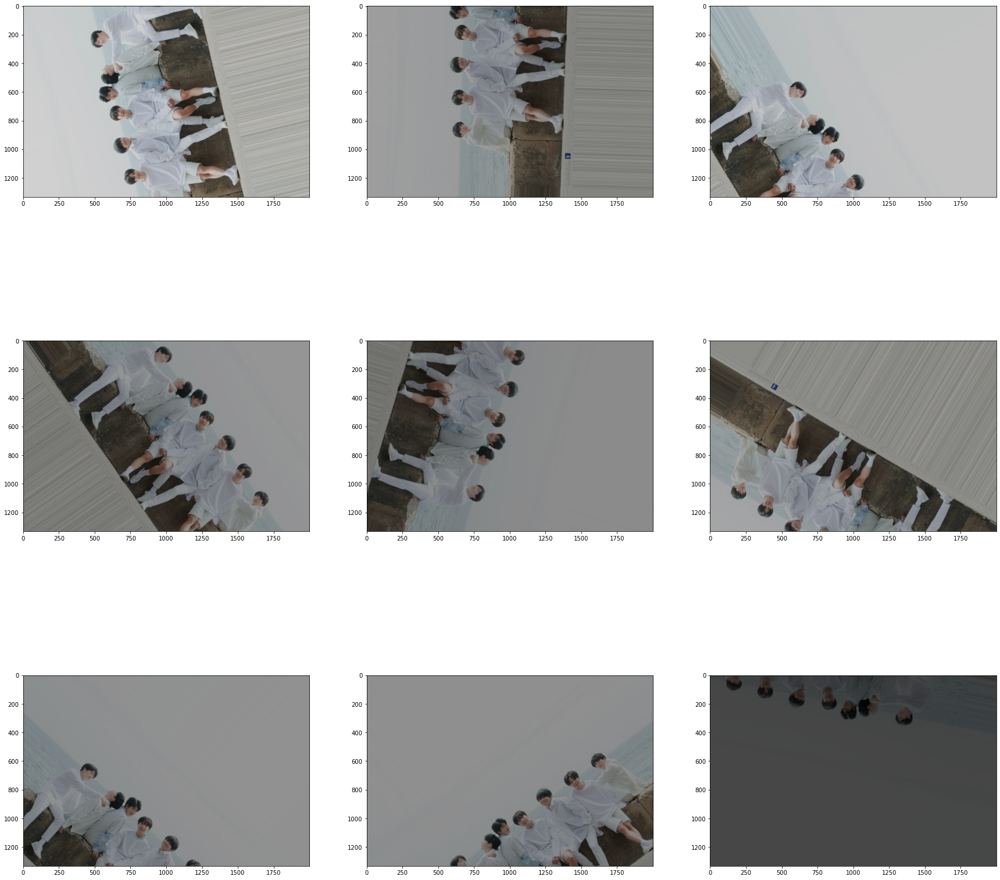

In [38]:
datagen = ImageDataGenerator(rotation_range=90,
horizontal_flip=True, 
vertical_flip=True,
height_shift_range=0.5,
width_shift_range=[-200,200],
brightness_range=[0.2,1])
it = datagen.flow(samples, batch_size=1)
fig = plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3,3,i+1) 
    batch = it.next()
    image = batch[0].astype('uint8') # 4차원 -> 3차원 // float -> unsigned int8 (양수만 있는 8bit: 0~255)
    plt.imshow(image)

In [39]:
# flow_from_directory # 폴더명에 맞춰서 이미지 명을 맞춰라

In [40]:
import keras
import numpy as np
import cv2
np.random.seed(15)

path = 'example'

In [49]:
generator = ImageDataGenerator(rotation_range = 20,
                               width_shift_range = 0.2,
                               height_shift_range = 0.2,
                               rescale = 1. / 255) # 픽셀값 0~1사이

In [54]:
batch_size = 4 # 한번에 4장의 이미지를 읽어옴
iterations = 5 # 5번의 이미지 증식
images = []

In [55]:
obj = generator.flow_from_directory(path,
                                    target_size = (150, 150), # 이미지가 이렇게 줄어듬
                                    batch_size = batch_size,
                                    class_mode = 'binary') # 폴더명에 따라 레이블링 방식. binary하면 0또는 1로.

Found 4 images belonging to 2 classes.


In [56]:
for i in enumerate(range(iterations)):
    img, label = obj.next()
    n_img = len(label)
    # keras는 rgb 방식으로 이미지를 처리함. openCV: bgr 방식
    base = cv2.cvtColor(img[0],cv2.COLOR_RGB2BGR) # 4차원 -> 3차원 이미지를 RGB -> BGR

    for idx in range(n_img - 1):
        img2 = cv2.cvtColor(img[idx + 1], cv2.COLOR_RGB2BGR)
        base = np.hstack((base, img2))
    images.append(base)

img = images[0]
for idx in range(len(images) - 1):
    img = np.vstack((img, images[idx + 1]))

In [57]:
cv2.imshow('result',img)
cv2.waitKey()
cv2.destroyAllWindows()

In [ ]:
# CNN
# Conv2D(filters: 필터 갯수, kernel_size : 필터 크기(행,열),strides, 
#        padding: 경계처리방법-> valid(no padding), same(출력 이미지 사이즈 == 입력 이미지 사이즈) )
#        activation: 활성화 함수 None(linear), relu: 음수 0, 양수는 그대로, sigmoid(이진분류), softmax(다중분류) 
# Input shape: 1) 이미지 형식이 channels_first(샘플수, 채널수, 행, 열) 4차원 텐서
#              2)             channels_last(샘플수, 행, 열, 채널수) 4차원 텐서
# Output shape: channels_first
#               channels_last
# Conv2D(32, (5,5), padding = 'valid', input_shape=(28,28,1), activation = 'relu')
# 필터 갯수, 필터의 행렬, no padding,       (행, 열, 채널)           활성화함수 relu

# Conv2D(1, (2,2), padding = 'valid', input_shape=(3,3,1), activation = 'relu')
# 필터 크기 1개
# 필터크기 2x2
# 입력이미지 채널1, 너비3, 높이3 픽셀

# Dense(4, input_dim = 9)
# 입력노드 9개(3*3), 출력노드가 4개(2*2)
# MaxPooling2D(pool_size=(2,2)) # (2,2)면 이미지 크기가 반으로 줄어듬. 가로 1/2, 세로 1/2

# Flatten: 1차원으로 펼침

In [58]:
import numpy
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.utils import np_utils

In [61]:
model = Sequential()
model.add(Conv2D(2, (3, 3), padding='same', activation='relu', input_shape=(8, 8, 1)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(3, (2, 2), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(8, activation='relu')) # Param count  12*8+8
model.add(Dense(3, activation='softmax')) # Param count  8*3+3
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 8, 8, 2)           20        
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 4, 4, 2)           0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 4, 4, 3)           27        
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 2, 2, 3)           0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 12)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 8)                 104       
_________________________________________________________________
dense_3 (Dense)              (None, 3)                

In [85]:
train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)

In [86]:
train_generator = train_datagen.flow_from_directory('handwriting_shape/train',
                                                   target_size=(24,24),
                                                   batch_size=3, # 한 폴더에서 1개씩 가져와서 증식(폴더 3개)
                                                   class_mode='categorical') 

Found 45 images belonging to 3 classes.


In [87]:
test_generator = test_datagen.flow_from_directory('handwriting_shape/test',
                                                   target_size=(24,24),
                                                   batch_size=3, # 한 폴더에서 1개씩 가져와서 증식(폴더 3개)
                                                   class_mode='categorical') 

Found 15 images belonging to 3 classes.


In [69]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(24,24,3))) # output Shape = (24-3+1, 24-3+1, 32)
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 22, 22, 32)        896       
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 20, 20, 64)        18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 10, 10, 64)        0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 6400)              0         
_________________________________________________________________
dense_6 (Dense)              (None, 128)               819328    
_________________________________________________________________
dense_7 (Dense)              (None, 3)                 387       
Total params: 839,107
Trainable params: 839,107
Non-trainable params: 0
________________________________________________

In [88]:
model.compile(loss = 'categorical_crossentropy',optimizer='adam',metrics=['acc'])

In [89]:
# generator를 썼기때문에 그냥 fit이 아니라 fit_generator를 씀
model.fit_generator(train_generator, steps_per_epoch=15, # 총 45장 == batch: 3 * epochs 15
                    epochs=50,validation_data=test_generator,
                    validation_steps=5  # 1epochs = batch: 3 * 5회 반복
                   )

Epoch 1/50
15/15 [==============================] - 0s 25ms/step - loss: 2.5166e-07 - acc: 1.0000 - val_loss: 0.0062 - val_acc: 1.0000
Epoch 2/50
15/15 [==============================] - 0s 18ms/step - loss: 2.9140e-08 - acc: 1.0000 - val_loss: 0.0110 - val_acc: 1.0000
Epoch 3/50
15/15 [==============================] - 0s 19ms/step - loss: 1.0596e-08 - acc: 1.0000 - val_loss: 0.0091 - val_acc: 1.0000
Epoch 4/50
15/15 [==============================] - 0s 19ms/step - loss: 5.2982e-09 - acc: 1.0000 - val_loss: 0.0058 - val_acc: 1.0000
Epoch 5/50
15/15 [==============================] - 0s 18ms/step - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.0061 - val_acc: 1.0000
Epoch 6/50
15/15 [==============================] - 0s 18ms/step - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.0073 - val_acc: 1.0000
Epoch 7/50
15/15 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.0088 - val_acc: 1.0000
Epoch 8/50
15/15 [==============================] - 0s 

In [90]:
scores = model.evaluate_generator(test_generator, steps = 5)

In [91]:
print("loss: ",scores[0])
print("acc: ",scores[1])

loss:  0.017728226259350777
acc:  1.0


In [92]:
output = model.predict_generator(test_generator, steps=5)
print(output)

[[1.000 0.000 0.000]
 [0.000 0.000 1.000]
 [0.999 0.000 0.001]
 [0.000 1.000 0.000]
 [0.000 1.000 0.000]
 [0.000 1.000 0.000]
 [0.000 0.000 1.000]
 [0.029 0.768 0.202]
 [1.000 0.000 0.000]
 [0.000 0.000 1.000]
 [1.000 0.000 0.000]
 [0.000 0.000 1.000]
 [0.000 1.000 0.000]
 [0.000 0.001 0.999]
 [1.000 0.000 0.000]]


In [97]:
test_generator = test_datagen.flow_from_directory('handwriting_shape/test2',
                                                   target_size=(24,24),
                                                   batch_size=3, # 한 폴더에서 1개씩 가져와서 증식(폴더 3개)
                                                   class_mode='categorical') 

Found 15 images belonging to 3 classes.


In [103]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(24,24,3))) # output Shape = (24-3+1, 24-3+1, 32)
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))
model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_14 (Conv2D)           (None, 22, 22, 32)        896       
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 20, 20, 64)        18496     
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 10, 10, 64)        0         
_________________________________________________________________
flatten_7 (Flatten)          (None, 6400)              0         
_________________________________________________________________
dense_14 (Dense)             (None, 128)               819328    
_________________________________________________________________
dense_15 (Dense)             (None, 3)                 387       
Total params: 839,107
Trainable params: 839,107
Non-trainable params: 0
________________________________________________

In [104]:
model.compile(loss = 'categorical_crossentropy',optimizer='adam',metrics=['acc'])

In [105]:
# generator를 썼기때문에 그냥 fit이 아니라 fit_generator를 씀
model.fit_generator(train_generator, steps_per_epoch=15, # 총 45장 == batch: 3 * epochs 15
                    epochs=200,validation_data=test_generator,
                    validation_steps=5  # 1epochs = batch: 3 * 5회 반복
                   )

Epoch 1/200
15/15 [==============================] - 0s 25ms/step - loss: 1.4197 - acc: 0.4444 - val_loss: 1.1470 - val_acc: 0.3333
Epoch 2/200
15/15 [==============================] - 0s 19ms/step - loss: 0.5441 - acc: 0.8667 - val_loss: 1.8573 - val_acc: 0.3333
Epoch 3/200
15/15 [==============================] - 0s 17ms/step - loss: 0.1071 - acc: 1.0000 - val_loss: 2.7431 - val_acc: 0.3333
Epoch 4/200
15/15 [==============================] - 0s 19ms/step - loss: 0.0278 - acc: 0.9778 - val_loss: 3.2919 - val_acc: 0.3333
Epoch 5/200
15/15 [==============================] - 0s 16ms/step - loss: 0.0032 - acc: 1.0000 - val_loss: 3.8765 - val_acc: 0.3333
Epoch 6/200
15/15 [==============================] - 0s 16ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 4.1598 - val_acc: 0.3333
Epoch 7/200
15/15 [==============================] - 0s 12ms/step - loss: 8.9518e-04 - acc: 1.0000 - val_loss: 4.2310 - val_acc: 0.3333
Epoch 8/200
15/15 [==============================] - 0s 14ms/step - loss

Epoch 61/200
15/15 [==============================] - 0s 9ms/step - loss: 6.7260e-06 - acc: 1.0000 - val_loss: 5.7152 - val_acc: 0.2667
Epoch 62/200
15/15 [==============================] - 0s 9ms/step - loss: 6.5670e-06 - acc: 1.0000 - val_loss: 5.7283 - val_acc: 0.2667
Epoch 63/200
15/15 [==============================] - 0s 11ms/step - loss: 6.3445e-06 - acc: 1.0000 - val_loss: 5.7268 - val_acc: 0.2667
Epoch 64/200
15/15 [==============================] - 0s 10ms/step - loss: 6.0160e-06 - acc: 1.0000 - val_loss: 5.7433 - val_acc: 0.2667
Epoch 65/200
15/15 [==============================] - 0s 9ms/step - loss: 5.7856e-06 - acc: 1.0000 - val_loss: 5.7457 - val_acc: 0.2667
Epoch 66/200
15/15 [==============================] - 0s 10ms/step - loss: 5.6107e-06 - acc: 1.0000 - val_loss: 5.7759 - val_acc: 0.2667
Epoch 67/200
15/15 [==============================] - 0s 9ms/step - loss: 5.4889e-06 - acc: 1.0000 - val_loss: 5.7805 - val_acc: 0.2667
Epoch 68/200
15/15 [=========================

Epoch 121/200
15/15 [==============================] - 0s 11ms/step - loss: 1.1682e-06 - acc: 1.0000 - val_loss: 6.3297 - val_acc: 0.2667
Epoch 122/200
15/15 [==============================] - 0s 9ms/step - loss: 1.1524e-06 - acc: 1.0000 - val_loss: 6.3388 - val_acc: 0.2667
Epoch 123/200
15/15 [==============================] - 0s 9ms/step - loss: 1.1126e-06 - acc: 1.0000 - val_loss: 6.3343 - val_acc: 0.2667
Epoch 124/200
15/15 [==============================] - 0s 9ms/step - loss: 1.1020e-06 - acc: 1.0000 - val_loss: 6.3498 - val_acc: 0.2667
Epoch 125/200
15/15 [==============================] - 0s 9ms/step - loss: 1.0835e-06 - acc: 1.0000 - val_loss: 6.3508 - val_acc: 0.2667
Epoch 126/200
15/15 [==============================] - 0s 9ms/step - loss: 1.0596e-06 - acc: 1.0000 - val_loss: 6.3455 - val_acc: 0.2667
Epoch 127/200
15/15 [==============================] - 0s 9ms/step - loss: 1.0331e-06 - acc: 1.0000 - val_loss: 6.3644 - val_acc: 0.2667
Epoch 128/200
15/15 [===================

15/15 [==============================] - 0s 10ms/step - loss: 4.2650e-07 - acc: 1.0000 - val_loss: 6.6685 - val_acc: 0.2667
Epoch 181/200
15/15 [==============================] - 0s 9ms/step - loss: 4.2121e-07 - acc: 1.0000 - val_loss: 6.6643 - val_acc: 0.2667
Epoch 182/200
15/15 [==============================] - 0s 10ms/step - loss: 4.1326e-07 - acc: 1.0000 - val_loss: 6.6704 - val_acc: 0.2667
Epoch 183/200
15/15 [==============================] - 0s 10ms/step - loss: 4.1326e-07 - acc: 1.0000 - val_loss: 6.6785 - val_acc: 0.2667
Epoch 184/200
15/15 [==============================] - 0s 11ms/step - loss: 4.0531e-07 - acc: 1.0000 - val_loss: 6.6846 - val_acc: 0.2667
Epoch 185/200
15/15 [==============================] - 0s 10ms/step - loss: 4.0531e-07 - acc: 1.0000 - val_loss: 6.6901 - val_acc: 0.2667
Epoch 186/200
15/15 [==============================] - 0s 9ms/step - loss: 3.9471e-07 - acc: 1.0000 - val_loss: 6.6935 - val_acc: 0.2667
Epoch 187/200
15/15 [=============================

In [106]:
scores = model.evaluate_generator(
            test_generator, 
            steps = 5)

output = model.predict_generator(
            test_generator, 
            steps = 5)

np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})
print(scores)
print(output)

0.2666666805744171
[[0.521 0.003 0.476]
 [0.000 0.000 1.000]
 [0.348 0.000 0.652]
 [0.000 0.001 0.999]
 [0.000 0.000 1.000]
 [0.000 0.027 0.973]
 [0.000 0.000 1.000]
 [0.631 0.000 0.369]
 [0.001 0.000 0.999]
 [0.000 0.000 1.000]
 [0.000 0.011 0.989]
 [0.000 0.000 1.000]
 [0.867 0.000 0.133]
 [0.000 0.000 1.000]
 [0.000 0.000 1.000]]


In [107]:
np.random.seed(5)
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

data_aug_gen = ImageDataGenerator(rescale=1./255, 
                                  rotation_range=15,
                                  width_shift_range=0.1,
                                  height_shift_range=0.1,
                                  shear_range=0.5,
                                  zoom_range=[0.8, 2.0],
                                  horizontal_flip=True,
                                  vertical_flip=True,
                                  fill_mode='nearest')

In [110]:
img = load_img('handwriting_shape/train/triangle/triangle001.png')

In [113]:
x = img_to_array(img)
x = x.reshape((1,) + x.shape)
i = 0
for batch in data_aug_gen.flow(x, batch_size=1, save_to_dir='preview', save_prefix='tri', 
                                save_format='png'):
    i += 1
    if i > 30: 
        break

In [114]:
train_datagen = ImageDataGenerator(rescale=1./255, 
                                   rotation_range=15,
                                   width_shift_range=0.1,
                                   height_shift_range=0.1,
                                   shear_range=0.5,
                                   zoom_range=[0.8, 2.0],
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   fill_mode='nearest') #파일로 저장하지는 않고!

In [115]:
train_generator = train_datagen.flow_from_directory(
        'handwriting_shape/train',
        target_size=(24, 24),
        batch_size=3,
        class_mode='categorical')

Found 45 images belonging to 3 classes.


In [116]:
test_generator = test_datagen.flow_from_directory('handwriting_shape/test2',
                                                   target_size=(24,24),
                                                   batch_size=3, # 한 폴더에서 1개씩 가져와서 증식(폴더 3개)
                                                   class_mode='categorical') 

Found 15 images belonging to 3 classes.


In [118]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(24,24,3)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_18 (Conv2D)           (None, 22, 22, 32)        896       
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 20, 20, 64)        18496     
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 10, 10, 64)        0         
_________________________________________________________________
flatten_9 (Flatten)          (None, 6400)              0         
_________________________________________________________________
dense_18 (Dense)             (None, 128)               819328    
_________________________________________________________________
dense_19 (Dense)             (None, 3)                 387       
Total params: 839,107
Trainable params: 839,107
Non-trainable params: 0
________________________________________________

In [120]:
model.fit_generator(train_generator, steps_per_epoch=15, # 총 45장 == batch: 3 * epochs 15
                    epochs=200,validation_data=test_generator,
                    validation_steps=5  # 1epochs = batch: 3 * 5회 반복
                   )

Epoch 1/200
15/15 [==============================] - 0s 19ms/step - loss: 1.0741 - accuracy: 0.4444 - val_loss: 1.0255 - val_accuracy: 0.5333
Epoch 2/200
15/15 [==============================] - 0s 16ms/step - loss: 0.9229 - accuracy: 0.6444 - val_loss: 1.0158 - val_accuracy: 0.6000
Epoch 3/200
15/15 [==============================] - 0s 17ms/step - loss: 0.6250 - accuracy: 0.6889 - val_loss: 1.2157 - val_accuracy: 0.5333
Epoch 4/200
15/15 [==============================] - 0s 18ms/step - loss: 0.7012 - accuracy: 0.7333 - val_loss: 1.3129 - val_accuracy: 0.6000
Epoch 5/200
15/15 [==============================] - 0s 17ms/step - loss: 0.6896 - accuracy: 0.7556 - val_loss: 1.7535 - val_accuracy: 0.6000
Epoch 6/200
15/15 [==============================] - 0s 16ms/step - loss: 0.4678 - accuracy: 0.8222 - val_loss: 1.0412 - val_accuracy: 0.6667
Epoch 7/200
15/15 [==============================] - 0s 18ms/step - loss: 0.5539 - accuracy: 0.8000 - val_loss: 1.0775 - val_accuracy: 0.6667
Epoch 

15/15 [==============================] - 0s 10ms/step - loss: 0.1311 - accuracy: 0.9333 - val_loss: 1.8121 - val_accuracy: 0.7333
Epoch 59/200
15/15 [==============================] - 0s 11ms/step - loss: 0.1386 - accuracy: 0.9556 - val_loss: 1.3599 - val_accuracy: 0.8000
Epoch 60/200
15/15 [==============================] - 0s 9ms/step - loss: 0.1148 - accuracy: 0.9333 - val_loss: 4.3751 - val_accuracy: 0.4667
Epoch 61/200
15/15 [==============================] - 0s 10ms/step - loss: 0.4376 - accuracy: 0.9111 - val_loss: 2.5943 - val_accuracy: 0.6000
Epoch 62/200
15/15 [==============================] - 0s 9ms/step - loss: 0.2252 - accuracy: 0.9556 - val_loss: 1.1339 - val_accuracy: 0.7333
Epoch 63/200
15/15 [==============================] - 0s 9ms/step - loss: 0.1222 - accuracy: 0.9778 - val_loss: 1.8587 - val_accuracy: 0.6000
Epoch 64/200
15/15 [==============================] - 0s 10ms/step - loss: 0.0436 - accuracy: 0.9778 - val_loss: 1.4059 - val_accuracy: 0.6667
Epoch 65/200
15

15/15 [==============================] - 0s 9ms/step - loss: 0.0132 - accuracy: 1.0000 - val_loss: 4.9704 - val_accuracy: 0.5333
Epoch 116/200
15/15 [==============================] - 0s 9ms/step - loss: 0.0846 - accuracy: 0.9778 - val_loss: 3.2524 - val_accuracy: 0.7333
Epoch 117/200
15/15 [==============================] - 0s 10ms/step - loss: 0.1140 - accuracy: 0.9778 - val_loss: 1.5499 - val_accuracy: 0.7333
Epoch 118/200
15/15 [==============================] - 0s 10ms/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 1.8497 - val_accuracy: 0.7333
Epoch 119/200
15/15 [==============================] - 0s 10ms/step - loss: 0.0512 - accuracy: 0.9778 - val_loss: 2.6632 - val_accuracy: 0.7333
Epoch 120/200
15/15 [==============================] - 0s 10ms/step - loss: 0.0888 - accuracy: 0.9778 - val_loss: 1.6175 - val_accuracy: 0.7333
Epoch 121/200
15/15 [==============================] - 0s 9ms/step - loss: 0.0484 - accuracy: 0.9778 - val_loss: 1.3029 - val_accuracy: 0.7333
Epoch 122

Epoch 172/200
15/15 [==============================] - 0s 9ms/step - loss: 0.0088 - accuracy: 1.0000 - val_loss: 2.3348 - val_accuracy: 0.7333
Epoch 173/200
15/15 [==============================] - 0s 9ms/step - loss: 0.0479 - accuracy: 0.9778 - val_loss: 2.6350 - val_accuracy: 0.6667
Epoch 174/200
15/15 [==============================] - 0s 9ms/step - loss: 0.1681 - accuracy: 0.9778 - val_loss: 2.1620 - val_accuracy: 0.7333
Epoch 175/200
15/15 [==============================] - 0s 12ms/step - loss: 0.1079 - accuracy: 0.9778 - val_loss: 1.9839 - val_accuracy: 0.7333
Epoch 176/200
15/15 [==============================] - 0s 9ms/step - loss: 0.0060 - accuracy: 1.0000 - val_loss: 1.9984 - val_accuracy: 0.6667
Epoch 177/200
15/15 [==============================] - 0s 9ms/step - loss: 0.1726 - accuracy: 0.9333 - val_loss: 1.9082 - val_accuracy: 0.7333
Epoch 178/200
15/15 [==============================] - 0s 9ms/step - loss: 0.0101 - accuracy: 1.0000 - val_loss: 1.8709 - val_accuracy: 0.733

In [122]:
scores = model.evaluate_generator(
            test_generator, 
            steps = 5)

output = model.predict_generator(
            test_generator, 
            steps = 5)

np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})
print(scores)
print(output)

[1.7993247509002686, 0.7333333492279053]
[[1.000 0.000 0.000]
 [0.001 0.999 0.000]
 [0.000 0.000 1.000]
 [0.000 0.000 1.000]
 [0.022 0.142 0.836]
 [0.000 1.000 0.000]
 [0.000 0.000 1.000]
 [0.008 0.000 0.992]
 [0.001 0.999 0.000]
 [0.000 0.997 0.003]
 [0.000 0.000 1.000]
 [0.000 0.001 0.999]
 [0.000 0.000 1.000]
 [0.000 0.000 1.000]
 [0.996 0.004 0.000]]


In [123]:
# 이거로 인덱스 확인!
test_generator.class_indices

{'circle': 0, 'rectangle': 1, 'triangle': 2}

In [ ]:
# keras 책 generator 봅세.
# p.189